# Experiment 1A

refer to one note for detailed description under docs/project_document.

## Data analysis: time series decomposition

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression


from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score

import plotly
import plotly.graph_objects as go


In [2]:
np.random.seed(45)

In [3]:
data_path = ".././data/"
file_name = "data.csv"
data = pd.read_csv(data_path + file_name)
data.head()

,time,Comms and Services,Space Heating,Hot Water,Sockets,Lighting,Bld_EngCons,Car Chargers,weekend,bank holiday,...,forecastperiod,forecast_temperature,forecast_feelslike,forecast_weathertype,forecast_windspeed,forecast_uvindex,forecast_precipitationprobability,forecast_winddirection,forecast_visibility,forecast_interval
0,2019-04-01 00:00:00+00,0.515253,0.856489,0.000000,0.051467,0.124797,1.548006,0.032239,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-04-01 01:00:00+00,0.687381,0.786147,0.085386,0.050931,0.151708,1.761553,0.042894,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-04-01 02:00:00+00,0.687678,3.530669,0.099239,0.055706,0.151233,4.524525,0.043100,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2019-04-01 03:00:00+00,0.690139,4.044003,0.098467,0.050019,0.151436,5.034064,0.043131,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-04-01 04:00:00+00,0.687081,4.223769,0.091533,0.050142,0.151331,5.203856,0.043031,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# rename the columns to make it easier for accessing
new_col_names_map =  {i: i.lower().replace(" ", "_") for i in data.columns}
data = data.rename(columns=new_col_names_map)
# set the timestamp as the index for easy access of the data
data = data.set_index("time")
# subset the dataset to load only the post covid dataset
data = data[data.index >= "2021-01-01"]

In [5]:
data.shape # this is the size of the data

(26280, 25)

In [6]:
data.head()

,comms_and_services,space_heating,hot_water,sockets,lighting,bld_engcons,car_chargers,weekend,bank_holiday,hour,...,forecastperiod,forecast_temperature,forecast_feelslike,forecast_weathertype,forecast_windspeed,forecast_uvindex,forecast_precipitationprobability,forecast_winddirection,forecast_visibility,forecast_interval
time,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00+00,0.591504,3.425193,0.000000,0.049433,0.154873,4.221002,0.0,False,True,0,...,2021-01-02 00:00:00+00,3.0,-1.0,2.0,11.0,0.0,0.0,N,VG,1 day
2021-01-01 01:00:00+00,0.591203,4.012907,0.000000,0.047753,0.154846,4.806708,0.0,False,True,1,...,2021-01-02 00:00:00+00,3.0,-1.0,2.0,11.0,0.0,0.0,N,VG,23:00:00
2021-01-01 02:00:00+00,0.591666,5.342417,0.444782,0.051869,0.154997,6.585732,0.0,False,True,2,...,2021-01-02 00:00:00+00,3.0,-1.0,2.0,11.0,0.0,1.0,N,VG,22:00:00
2021-01-01 03:00:00+00,0.591278,5.756598,0.000000,0.043028,0.154626,6.545530,0.0,False,True,3,...,2021-01-02 03:00:00+00,2.0,-2.0,0.0,11.0,0.0,1.0,NNW,VG,1 day
2021-01-01 04:00:00+00,0.591354,5.415492,0.000000,0.050306,0.154498,6.211650,0.0,False,True,4,...,2021-01-02 03:00:00+00,2.0,-2.0,0.0,11.0,0.0,1.0,NNW,VG,23:00:00


### Handle missing values

In [7]:
circuit_columns = [
    "comms_and_services", "space_heating", "hot_water", "sockets", "lighting", "car_chargers"
]
data[circuit_columns].isna().sum()

comms_and_services    444
space_heating         444
hot_water             444
sockets               444
lighting              444
car_chargers          444
dtype: int64

In [8]:
# interpolate only the cirucit columns to consider for decomposition plot
for column in circuit_columns:
    data[column] = data[column].interpolate(method="linear", limit_direction="both")

data[circuit_columns].isna().sum()

comms_and_services    0
space_heating         0
hot_water             0
sockets               0
lighting              0
car_chargers          0
dtype: int64

### Decomposition as additive model 

#### Comms and services

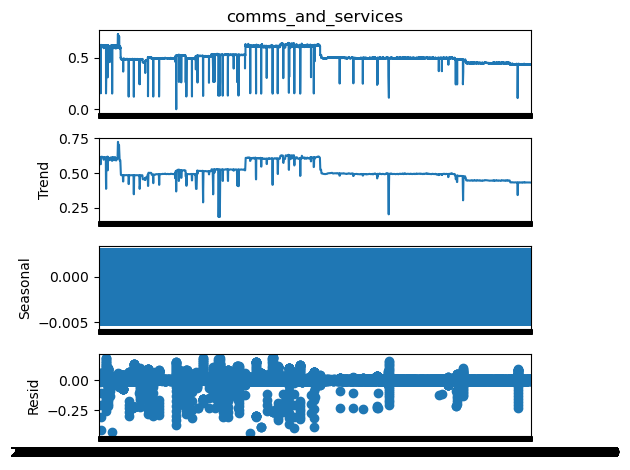

In [16]:

result = seasonal_decompose(data["comms_and_services"], model='additive', period=24)
result.plot()
plt.xticks(rotation=90)
plt.show()

#### Space heating

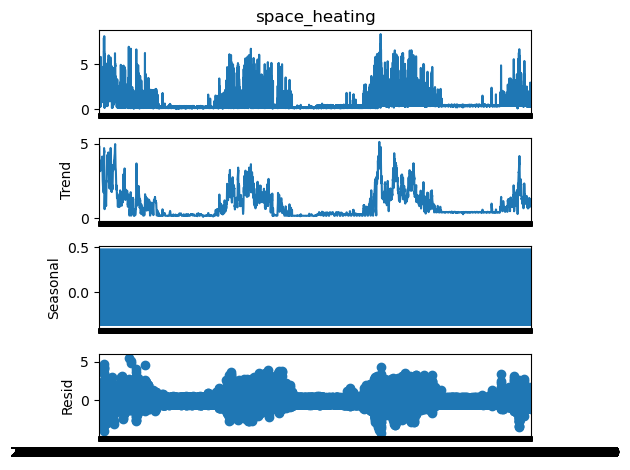

In [17]:
result = seasonal_decompose(data["space_heating"], model='additive', period=24)
result.plot()
plt.show()

#### Car Chargers

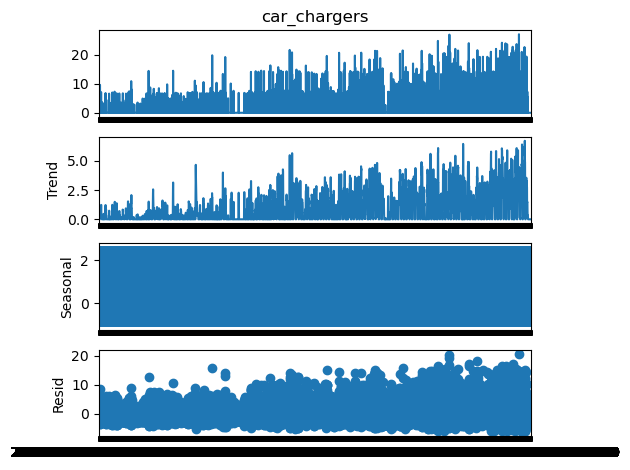

In [18]:
result = seasonal_decompose(data["car_chargers"], model='additive', period=24)
result.plot()
plt.show()

#### All other circuits - aka - building energy consumption

In [22]:
single_circuits = ["comms_and_services", "space_heating", "car_chargers"]
plot_data = data.drop(columns=single_circuits, axis=1)
plot_data.shape

(26280, 22)

In [29]:
other_circuits = ["hot_water", "sockets", "lighting"]
plot_data["total_load"] = plot_data[other_circuits].sum(axis=1)

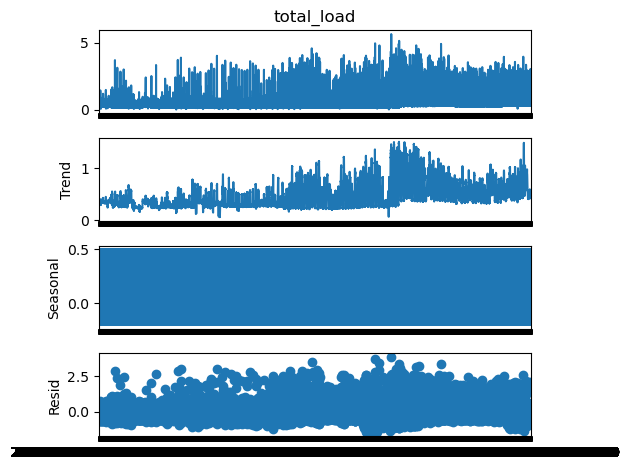

In [30]:
result = seasonal_decompose(plot_data["total_load"], model='additive', period=24)
result.plot()
plt.show()

## Feature Engineering

#### Handle missing values for the rest of the fields

In [9]:
missing_columns = pd.DataFrame(data.isna().sum().reset_index())
missing_columns = missing_columns[missing_columns[0] > 0]
missing_columns = missing_columns["index"].tolist()

# impute the data
for column in missing_columns:
    data[column] = data[column].interpolate(method="linear", limit_direction="both")

data.isna().sum()

C:\Users\akson\AppData\Local\Temp\ipykernel_16024\1941193596.py:7: FutureWarning: Series.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  data[column] = data[column].interpolate(method="linear", limit_direction="both")


comms_and_services                     0
space_heating                          0
hot_water                              0
sockets                                0
lighting                               0
bld_engcons                            0
car_chargers                           0
weekend                                0
bank_holiday                           0
hour                                   0
day_of_week                            0
day_of_month                           0
month                                  0
year                                   0
forecast_datadate                      0
forecastperiod                       578
forecast_temperature                   0
forecast_feelslike                     0
forecast_weathertype                   0
forecast_windspeed                     0
forecast_uvindex                       0
forecast_precipitationprobability      0
forecast_winddirection               578
forecast_visibility                  578
forecast_interva

In [10]:
# drop the forecastperiod column
data = data.drop(columns=["forecastperiod", "forecast_interval", "forecast_datadate"], axis=0)
data.shape

(26280, 22)

#### Apply Transformations

In [11]:
# transform the forecast visibility

# Reference
# https://www.metoffice.gov.uk/weather/guides/what-does-this-forecast-mean#:~:text=Visibility%20measures%20the%20distance%20at,Less%20than%201%2C000%20metres
visibility_map = {
    "EX": 6, "VG": 5, "GO": 4, "MO": 3, "PO": 2, "VP": 1
}

data["forecast_visibility"] = data["forecast_visibility"].map(visibility_map)
data["forecast_visibility"].head()

time
2021-01-01 00:00:00+00    5.0
2021-01-01 01:00:00+00    5.0
2021-01-01 02:00:00+00    5.0
2021-01-01 03:00:00+00    5.0
2021-01-01 04:00:00+00    5.0
Name: forecast_visibility, dtype: float64

In [12]:
# forecast winddirection convertion to degrees 
data = data.copy()
degrees_map = pd.read_csv(".././data/degrees.csv", sep=",")
degrees_lookup = {abbrv: deg for abbrv, deg in zip(degrees_map["Abbrv."], degrees_map["Degrees"])}
data["forecast_winddirection"] = data["forecast_winddirection"].map(degrees_lookup)
data["forecast_winddirection"].value_counts()

forecast_winddirection
247.5    3434
270.0    2747
225.0    2398
292.5    2311
90.0     1669
315.0    1667
112.5    1639
337.5    1594
202.5    1485
180.0    1245
0.0      1073
135.0    1062
67.5     1025
45.0      872
157.5     773
22.5      708
Name: count, dtype: int64

In [13]:
# cyclic transformations
denom_map = {
    "hour": 24, "month": 12, "day_of_week": 7, "forecast_winddirection": 360
}

for col_name in denom_map:
    print(col_name)
    data[f"sine_{col_name}"] = np.sin(2 * np.pi * data[col_name] / denom_map[col_name])
    data[f"cos_{col_name}"] = np.cos(2 * np.pi * data[col_name] / denom_map[col_name])


hour
month
day_of_week
forecast_winddirection


In [14]:
# boolean transformation
data["weekend"] = data["weekend"].astype(int)
data["bank_holiday"] = data["bank_holiday"].astype(int)

In [15]:
data.head()

,comms_and_services,space_heating,hot_water,sockets,lighting,bld_engcons,car_chargers,weekend,bank_holiday,hour,...,forecast_winddirection,forecast_visibility,sine_hour,cos_hour,sine_month,cos_month,sine_day_of_week,cos_day_of_week,sine_forecast_winddirection,cos_forecast_winddirection
time,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00+00,0.591504,3.425193,0.000000,0.049433,0.154873,4.221002,0.0,0,1,0,...,0.0,5.0,0.000000,1.000000,0.5,0.866025,-0.974928,-0.222521,0.000000,1.00000
2021-01-01 01:00:00+00,0.591203,4.012907,0.000000,0.047753,0.154846,4.806708,0.0,0,1,1,...,0.0,5.0,0.258819,0.965926,0.5,0.866025,-0.974928,-0.222521,0.000000,1.00000
2021-01-01 02:00:00+00,0.591666,5.342417,0.444782,0.051869,0.154997,6.585732,0.0,0,1,2,...,0.0,5.0,0.500000,0.866025,0.5,0.866025,-0.974928,-0.222521,0.000000,1.00000
2021-01-01 03:00:00+00,0.591278,5.756598,0.000000,0.043028,0.154626,6.545530,0.0,0,1,3,...,337.5,5.0,0.707107,0.707107,0.5,0.866025,-0.974928,-0.222521,-0.382683,0.92388
2021-01-01 04:00:00+00,0.591354,5.415492,0.000000,0.050306,0.154498,6.211650,0.0,0,1,4,...,337.5,5.0,0.866025,0.500000,0.5,0.866025,-0.974928,-0.222521,-0.382683,0.92388


#### Standardize the data

In [16]:
def create_std_scaler(data, column_name):
    data_scaler = StandardScaler()
    if isinstance(column_name, str):
        column_name = [column_name]
    data_scaler = data_scaler.fit(data[column_name])
    transformed_data = data.copy()
    transformed_data[column_name] = data_scaler.transform(data[column_name])
    scaling_info = pd.DataFrame({
        "columns": column_name,
        "mean": data_scaler.mean_,
        "variance": data_scaler.var_,
        "scale_factor": data_scaler.scale_
    })
    print(scaling_info)
    return data_scaler, transformed_data[column_name]

In [156]:
def cal_metrics(actual, predictions):
    print("MAE:")
    print(mean_absolute_error(actual, predictions))
    print("MAPE:")
    print(mean_absolute_percentage_error(actual, predictions))
    print("R2 score: ")
    print(r2_score(actual, predictions))

## Models

In [169]:
model_predictions = pd.DataFrame()

### Comms and services

#### Univariate Linear regression

In [170]:
col_name = "comms_and_services"
# transform the data
cs_data_scaler, transformed_data = create_std_scaler(data, col_name)

# Training and testing data for comms and services
cs_train_data = transformed_data[transformed_data.index < '2023-01-01'][[col_name]]
cs_test_data = transformed_data[transformed_data.index >= '2023-01-01'][[col_name]]
cs_train_data.shape, cs_test_data.shape

              columns      mean  variance  scale_factor
0  comms_and_services  0.510156   0.00442      0.066484


((17520, 1), (8760, 1))

In [171]:
cs_train_data["y"] = cs_train_data[col_name].shift(-1)
cs_test_data["y"] = cs_test_data[col_name].shift(-1)

cs_train_data = cs_train_data.dropna(axis=0)
cs_test_data = cs_test_data.dropna(axis=0)

In [172]:
lin_reg = LinearRegression().fit(cs_train_data[col_name].to_numpy().reshape(cs_train_data.shape[0], 1), cs_train_data["y"].to_numpy())

In [173]:
cs_test_data["predictions"] = lin_reg.predict(cs_test_data[col_name].to_numpy().reshape(cs_test_data.shape[0], 1))

In [174]:
plot_data = cs_test_data.copy()
plot_data[["actual", "prediction"]]  = cs_data_scaler.inverse_transform(plot_data[["y", "predictions"]])
plot_data = plot_data.reset_index(drop=0)
plot_data.head()

,time,comms_and_services,y,predictions,actual,prediction
0,2023-01-01 00:00:00+00,-0.184500,-0.254888,-0.155550,0.493210,0.499815
1,2023-01-01 01:00:00+00,-0.254888,-0.258638,-0.221898,0.492961,0.495404
2,2023-01-01 02:00:00+00,-0.258638,-0.252703,-0.225434,0.493356,0.495169
3,2023-01-01 03:00:00+00,-0.252703,-0.247914,-0.219839,0.493674,0.495541
4,2023-01-01 04:00:00+00,-0.247914,-0.246469,-0.215324,0.493770,0.495841


In [175]:
cal_metrics(plot_data["y"], plot_data["predictions"])

MAE:
0.06201796456332832
MAPE:
0.1187582996993372
R2 score: 
0.9120851621901893


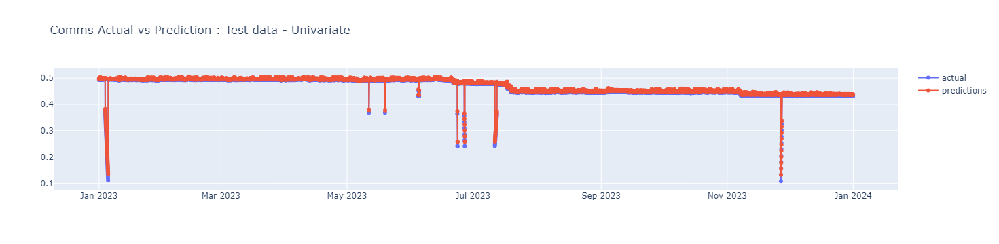

In [176]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["actual"].to_numpy(),
                    mode='lines+markers',
                    name='actual'))
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["prediction"].to_numpy(),
                    mode='lines+markers',
                    name='predictions'))
fig.update_layout(title_text="Comms Actual vs Prediction : Test data - Univariate")
fig.show()

In [35]:
asset_path = ".././assets/"

In [177]:
asset_path = ".././assets/"
file_name = 'uni_LR_comms_services2.html'
plotly.offline.plot(fig, filename=asset_path + file_name)

'.././assets/uni_LR_comms_services2.html'

#### Multivariate linear regression

In [178]:
column_name = ["comms_and_services", 'weekend', 'bank_holiday',
       'hour', 'day_of_week', 'day_of_month', 'month', 'year',
       'forecast_temperature', 'forecast_feelslike', 'forecast_weathertype',
       'forecast_windspeed', 'forecast_uvindex',
       'forecast_precipitationprobability', 'forecast_winddirection',
       'forecast_visibility', 'sine_hour', 'cos_hour', 'sine_month',
       'cos_month', 'sine_day_of_week', 'cos_day_of_week',
       'sine_forecast_winddirection', 'cos_forecast_winddirection', "y"]

# transform the data
cs_data = data.copy()
cs_data["y"] = cs_data[column_name[0]].shift(-1)
cs_data = cs_data.dropna(axis=0)
cs_data_scaler, transformed_data = create_std_scaler(cs_data, column_name[:-1])
cs_target_scaler, transformed_iv_data = create_std_scaler(cs_data, column_name[-1])

transformed_data = pd.concat(
    [transformed_data, transformed_iv_data], axis=1, ignore_index=False
)

# Training and testing data for comms and services
cs_train_data = transformed_data[transformed_data.index < '2023-01-01'][column_name]
cs_test_data = transformed_data[transformed_data.index >= '2023-01-01'][column_name]
cs_train_data.shape, cs_test_data.shape

                              columns         mean     variance  scale_factor
0                  comms_and_services     0.512007     0.003915      0.062573
1                             weekend     0.286993     0.204628      0.452358
2                        bank_holiday     0.025213     0.024577      0.156772
3                                hour    11.535115    47.970256      6.926056
4                         day_of_week     2.990234     4.013484      2.003368
5                        day_of_month    15.761721    77.705100      8.815050
6                               month     6.521380    11.891658      3.448428
7                                year  2022.015369     0.664680      0.815279
8                forecast_temperature    11.857710    21.556696      4.642919
9                  forecast_feelslike     9.363177    29.404385      5.422581
10               forecast_weathertype     6.340998    23.527392      4.850504
11                 forecast_windspeed    15.113147    51.363798 

((16959, 25), (8742, 25))

In [179]:
multi_lin_reg = LinearRegression()

In [180]:
multi_lin_reg_fit = multi_lin_reg.fit(cs_train_data[column_name[:-1]], cs_train_data[column_name[-1]])

In [181]:
cs_test_data["predictions"] = multi_lin_reg_fit.predict(cs_test_data[column_name[:-1]])

In [182]:
cal_metrics(cs_test_data["y"], cs_test_data["predictions"])

MAE:
0.19036953927260467
MAPE:
0.4183452602651257
R2 score: 
0.7980244484848682


- the R2 value is negative, the model fits the data really poorly if we cansider it in classical ml setting.
- But here, the distribution of test set is visibiliy different than the train set, the intuition of R2 score is not a generally a good practice in time series forecasting. reference [https://stats.stackexchange.com/questions/101546/what-is-the-problem-with-using-r-squared-in-time-series-models]

In [109]:
import seaborn as sns

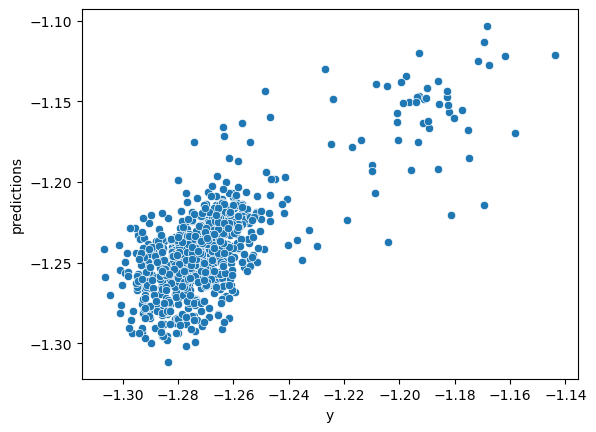

In [110]:
sns.scatterplot(data=cs_test_data, x="y", y="predictions")
plt.show()

In [183]:
coi = ["predictions", column_name[-1]]
plot_data = cs_test_data[coi].reset_index(drop=0)

In [184]:
plot_data[coi] = cs_target_scaler.inverse_transform(cs_test_data[coi])
plot_data.head()

,time,predictions,y
0,2023-01-01 00:00:00+00,0.509871,0.493210
1,2023-01-01 01:00:00+00,0.506084,0.492961
2,2023-01-01 02:00:00+00,0.506539,0.493356
3,2023-01-01 03:00:00+00,0.506878,0.493674
4,2023-01-01 04:00:00+00,0.507721,0.493770


In [185]:
model_predictions[["time", "cs_predictions"]] = plot_data[["time", "predictions"]]

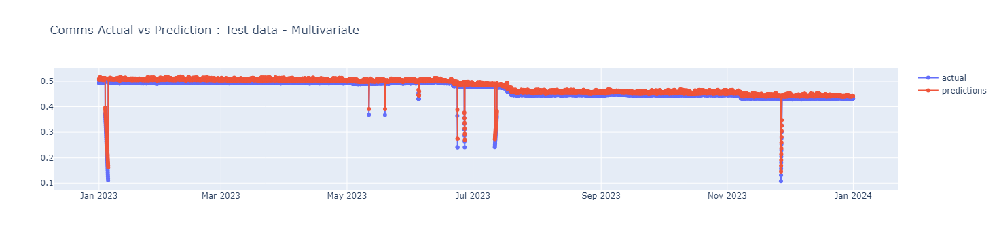

In [186]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["y"].to_numpy(),
                    mode='lines+markers',
                    name='actual'))
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["predictions"].to_numpy(),
                    mode='lines+markers',
                    name='predictions'))
fig.update_layout(title_text="Comms Actual vs Prediction : Test data - Multivariate")
fig.show()

In [187]:
file_name = 'multi_LR_comms_services2.html'
plotly.offline.plot(fig, filename=asset_path + file_name)

'.././assets/multi_LR_comms_services2.html'

### Space Heating

In [188]:
column_name = ["space_heating", 'weekend', 'bank_holiday',
       'hour', 'day_of_week', 'day_of_month', 'month', 'year',
       'forecast_temperature', 'forecast_feelslike', 'forecast_weathertype',
       'forecast_windspeed', 'forecast_uvindex',
       'forecast_precipitationprobability', 'forecast_winddirection',
       'forecast_visibility', 'sine_hour', 'cos_hour', 'sine_month',
       'cos_month', 'sine_day_of_week', 'cos_day_of_week',
       'sine_forecast_winddirection', 'cos_forecast_winddirection', "y"]

# transform the data
sh_data = data.copy()
sh_data["y"] = sh_data[column_name[0]].shift(-1)
sh_data = sh_data.dropna(axis=0)
sh_data_scaler, sh_transformed_data = create_std_scaler(sh_data, column_name[:-1])
sh_target_scaler, sh_transformed_target_data = create_std_scaler(sh_data, column_name[-1])

sh_transformed_data = pd.concat([sh_transformed_data, sh_transformed_target_data],ignore_index=False, axis=1)

# # Training and testing data for comms and services
sh_train_data = sh_transformed_data[sh_transformed_data.index < '2023-01-01'][column_name]
sh_test_data = sh_transformed_data[sh_transformed_data.index >= '2023-01-01'][column_name]
sh_train_data.shape, sh_test_data.shape

                              columns         mean     variance  scale_factor
0                       space_heating     0.926123     1.421973      1.192465
1                             weekend     0.286993     0.204628      0.452358
2                        bank_holiday     0.025213     0.024577      0.156772
3                                hour    11.535115    47.970256      6.926056
4                         day_of_week     2.990234     4.013484      2.003368
5                        day_of_month    15.761721    77.705100      8.815050
6                               month     6.521380    11.891658      3.448428
7                                year  2022.015369     0.664680      0.815279
8                forecast_temperature    11.857710    21.556696      4.642919
9                  forecast_feelslike     9.363177    29.404385      5.422581
10               forecast_weathertype     6.340998    23.527392      4.850504
11                 forecast_windspeed    15.113147    51.363798 

((16959, 25), (8742, 25))

In [189]:
multi_lin_reg = LinearRegression()

In [190]:
multi_lin_reg_fit = multi_lin_reg.fit(sh_train_data[column_name[:-1]], sh_train_data[column_name[-1]])

In [191]:
sh_test_data["predictions"] = multi_lin_reg_fit.predict(sh_test_data[column_name[:-1]])

In [192]:
cal_metrics(sh_test_data["y"], sh_test_data["predictions"])

MAE:
0.23623134944245155
MAPE:
0.9889805494008428
R2 score: 
0.7519832426944428


In [193]:
coi = ["predictions", column_name[-1]]
plot_data = sh_test_data[coi].reset_index(drop=0)

plot_data[coi] = sh_target_scaler.inverse_transform(plot_data[coi])

plot_data.head()

,time,predictions,y
0,2023-01-01 00:00:00+00,3.417115,3.150882
1,2023-01-01 01:00:00+00,3.045089,1.787612
2,2023-01-01 02:00:00+00,1.990622,1.715712
3,2023-01-01 03:00:00+00,1.934897,1.590172
4,2023-01-01 04:00:00+00,1.811163,1.562502


In [194]:
model_predictions["sh_predictions"] = plot_data["predictions"]

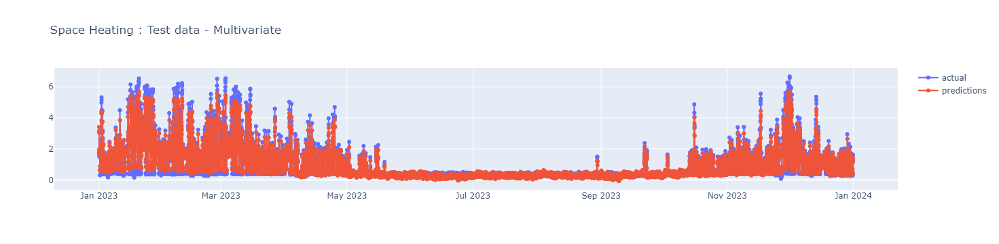

In [195]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["y"].to_numpy(),
                    mode='lines+markers',
                    name='actual'))
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["predictions"].to_numpy(),
                    mode='lines+markers',
                    name='predictions'))
fig.update_layout(title_text="Space Heating : Test data - Multivariate")
fig.show()

In [196]:
file_name = 'multi_LR_space_heating2.html'
plotly.offline.plot(fig, filename=asset_path + file_name)

'.././assets/multi_LR_space_heating2.html'

### Car chargers

In [197]:
column_name = ["car_chargers", 'weekend', 'bank_holiday',
       'hour', 'day_of_week', 'day_of_month', 'month', 'year',
       'forecast_temperature', 'forecast_feelslike', 'forecast_weathertype',
       'forecast_windspeed', 'forecast_uvindex',
       'forecast_precipitationprobability', 'forecast_winddirection',
       'forecast_visibility', 'sine_hour', 'cos_hour', 'sine_month',
       'cos_month', 'sine_day_of_week', 'cos_day_of_week',
       'sine_forecast_winddirection', 'cos_forecast_winddirection', "y"]

# transform the data
cc_data = data.copy()
cc_data["y"] = cc_data[column_name[0]].shift(-1)
cc_data = cc_data.dropna(axis=0)
cc_data_scaler, cc_transformed_data = create_std_scaler(cc_data, column_name[:-1])
cc_target_scaler, cc_transformed_target_data = create_std_scaler(cc_data, column_name[-1])

cc_transformed_data = pd.concat([cc_transformed_data, cc_transformed_target_data], ignore_index=False, axis=1)

# # Training and testing data for comms and services
cc_train_data = cc_transformed_data[cc_transformed_data.index < '2023-01-01'][column_name]
cc_test_data = cc_transformed_data[cc_transformed_data.index >= '2023-01-01'][column_name]
cc_train_data.shape, cc_test_data.shape

                              columns         mean     variance  scale_factor
0                        car_chargers     1.054399     9.303331      3.050136
1                             weekend     0.286993     0.204628      0.452358
2                        bank_holiday     0.025213     0.024577      0.156772
3                                hour    11.535115    47.970256      6.926056
4                         day_of_week     2.990234     4.013484      2.003368
5                        day_of_month    15.761721    77.705100      8.815050
6                               month     6.521380    11.891658      3.448428
7                                year  2022.015369     0.664680      0.815279
8                forecast_temperature    11.857710    21.556696      4.642919
9                  forecast_feelslike     9.363177    29.404385      5.422581
10               forecast_weathertype     6.340998    23.527392      4.850504
11                 forecast_windspeed    15.113147    51.363798 

((16959, 25), (8742, 25))

In [198]:
multi_lin_reg = LinearRegression()
multi_lin_reg_fit = multi_lin_reg.fit(cc_train_data[column_name[:-1]], cc_train_data[column_name[-1]])

cc_test_data["predictions"] = multi_lin_reg_fit.predict(cc_test_data[column_name[:-1]])
cal_metrics(cc_test_data["y"], cc_test_data["predictions"])

coi = ["predictions", column_name[-1]]
plot_data = cc_test_data[coi].reset_index(drop=0)

plot_data[coi] = cc_target_scaler.inverse_transform(plot_data[coi])

plot_data.head()

MAE:
0.36538791653073327
MAPE:
1.0789187016293589
R2 score: 
0.7113874956773352


,time,predictions,y
0,2023-01-01 00:00:00+00,-0.259127,0.0
1,2023-01-01 01:00:00+00,-0.128797,0.0
2,2023-01-01 02:00:00+00,0.041422,0.0
3,2023-01-01 03:00:00+00,0.196618,0.0
4,2023-01-01 04:00:00+00,0.327001,0.0


In [199]:
model_predictions["cc_predictions"] = plot_data["predictions"]

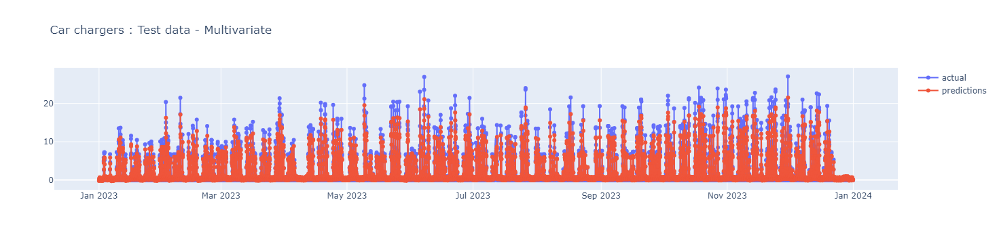

In [200]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["y"].to_numpy(),
                    mode='lines+markers',
                    name='actual'))
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["predictions"].to_numpy(),
                    mode='lines+markers',
                    name='predictions'))
fig.update_layout(title_text="Car chargers : Test data - Multivariate")
fig.show()

In [201]:
file_name = 'multi_LR_car_chargers2.html'
plotly.offline.plot(fig, filename=asset_path + file_name)

'.././assets/multi_LR_car_chargers2.html'

### All others

In [202]:
col_name = [
    'hot_water', 'sockets','lighting', 'weekend', 'bank_holiday',
       'hour', 'day_of_week', 'day_of_month', 'month', 'year',
       'forecast_temperature', 'forecast_feelslike', 'forecast_weathertype',
       'forecast_windspeed', 'forecast_uvindex',
       'forecast_precipitationprobability', 'forecast_winddirection',
       'forecast_visibility', 'sine_hour', 'cos_hour', 'sine_month',
       'cos_month', 'sine_day_of_week', 'cos_day_of_week',
       'sine_forecast_winddirection', 'cos_forecast_winddirection'
]
bldg_data = data[col_name]
bldg_data["total_load"] = bldg_data[['hot_water', 'sockets','lighting']].sum(axis=1)
column_name =   [
    "total_load", 'weekend', 'bank_holiday',
       'hour', 'day_of_week', 'day_of_month', 'month', 'year',
       'forecast_temperature', 'forecast_feelslike', 'forecast_weathertype',
       'forecast_windspeed', 'forecast_uvindex',
       'forecast_precipitationprobability', 'forecast_winddirection',
       'forecast_visibility', 'sine_hour', 'cos_hour', 'sine_month',
       'cos_month', 'sine_day_of_week', 'cos_day_of_week',
       'sine_forecast_winddirection', 'cos_forecast_winddirection', "y"
]

# transform the data
bldg_data["y"] = bldg_data[column_name[0]].shift(-1)
bldg_data = bldg_data.dropna(axis=0)
bldg_data_scaler, bldg_transformed_data = create_std_scaler(bldg_data, column_name[:-1])
bldg_target_scaler, bldg_transformed_target_data = create_std_scaler(bldg_data, column_name[-1])

bldg_transformed_data = pd.concat([bldg_transformed_data, bldg_transformed_target_data], ignore_index=False, axis=1)

# # Training and testing data for comms and services
bldg_train_data = bldg_transformed_data[bldg_transformed_data.index < '2023-01-01'][column_name]
bldg_test_data = bldg_transformed_data[bldg_transformed_data.index >= '2023-01-01'][column_name]
bldg_train_data.shape, bldg_test_data.shape

                              columns         mean     variance  scale_factor
0                          total_load     0.498093     0.332070      0.576255
1                             weekend     0.286993     0.204628      0.452358
2                        bank_holiday     0.025213     0.024577      0.156772
3                                hour    11.535115    47.970256      6.926056
4                         day_of_week     2.990234     4.013484      2.003368
5                        day_of_month    15.761721    77.705100      8.815050
6                               month     6.521380    11.891658      3.448428
7                                year  2022.015369     0.664680      0.815279
8                forecast_temperature    11.857710    21.556696      4.642919
9                  forecast_feelslike     9.363177    29.404385      5.422581
10               forecast_weathertype     6.340998    23.527392      4.850504
11                 forecast_windspeed    15.113147    51.363798 

C:\Users\akson\AppData\Local\Temp\ipykernel_16024\2264761247.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\akson\AppData\Local\Temp\ipykernel_16024\2264761247.py:25: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



((16959, 25), (8742, 25))

#### Multivariate Linear Regressor

In [203]:
multi_lin_reg = LinearRegression()
multi_lin_reg_fit = multi_lin_reg.fit(bldg_train_data[column_name[:-1]], bldg_train_data[column_name[-1]])

bldg_test_data["predictions"] = multi_lin_reg_fit.predict(bldg_test_data[column_name[:-1]])
cal_metrics(bldg_test_data["y"], bldg_test_data["predictions"])

coi = ["predictions", column_name[-1]]
plot_data = bldg_test_data[coi].reset_index(drop=0)

plot_data[coi] = bldg_target_scaler.inverse_transform(plot_data[coi])

plot_data.head()

MAE:
0.6254986637225494
MAPE:
1.7854280265787137
R2 score: 
0.3397626871854704


,time,predictions,y
0,2023-01-01 00:00:00+00,0.272502,0.142263
1,2023-01-01 01:00:00+00,0.173801,0.137709
2,2023-01-01 02:00:00+00,0.224970,0.160749
3,2023-01-01 03:00:00+00,0.282125,0.600717
4,2023-01-01 04:00:00+00,0.490521,0.262675


#### Random Forest Regressor

In [204]:
from sklearn.ensemble import RandomForestRegressor

In [205]:
rf_reg = RandomForestRegressor()
rf_reg_fit = rf_reg.fit(bldg_train_data[column_name[:-1]], bldg_train_data[column_name[-1]])

In [206]:
bldg_test_data["rf_predictions"] = rf_reg_fit.predict(bldg_test_data[column_name[:-1]])
cal_metrics(bldg_test_data["y"], bldg_test_data["rf_predictions"])
rf_pred = bldg_test_data[["rf_predictions"]].reset_index(drop=0)

plot_data = plot_data.merge(rf_pred, on="time", how="inner")
plot_data["rf_predictions"] = bldg_target_scaler.inverse_transform(plot_data[["rf_predictions"]])

plot_data.head()

MAE:
0.5133110235791012
MAPE:
1.7303472998972198
R2 score: 
0.4851392005024291


,time,predictions,y,rf_predictions
0,2023-01-01 00:00:00+00,0.272502,0.142263,0.202317
1,2023-01-01 01:00:00+00,0.173801,0.137709,0.339062
2,2023-01-01 02:00:00+00,0.224970,0.160749,0.309596
3,2023-01-01 03:00:00+00,0.282125,0.600717,0.290462
4,2023-01-01 04:00:00+00,0.490521,0.262675,0.147239


#### XGB Regressor

In [207]:
import xgboost as xg

In [208]:
xgb_r = xg.XGBRegressor(objective ='reg:squarederror', n_estimators = 50, seed = 123)
xgb_r_fit = xgb_r.fit(bldg_train_data[column_name[:-1]], bldg_train_data[column_name[-1]])

In [209]:
bldg_test_data["xgb_predictions"] = xgb_r_fit.predict(bldg_test_data[column_name[:-1]])
cal_metrics(bldg_test_data["y"], bldg_test_data["xgb_predictions"])
rf_pred = bldg_test_data[["xgb_predictions"]].reset_index(drop=0)

plot_data = plot_data.merge(rf_pred, on="time", how="inner")
plot_data["xgb_predictions"] = bldg_target_scaler.inverse_transform(plot_data[["xgb_predictions"]])

plot_data.head()

MAE:
0.5439905623925213
MAPE:
1.752164835896202
R2 score: 
0.4059366766864708


,time,predictions,y,rf_predictions,xgb_predictions
0,2023-01-01 00:00:00+00,0.272502,0.142263,0.202317,0.275144
1,2023-01-01 01:00:00+00,0.173801,0.137709,0.339062,0.282529
2,2023-01-01 02:00:00+00,0.224970,0.160749,0.309596,0.395922
3,2023-01-01 03:00:00+00,0.282125,0.600717,0.290462,0.281834
4,2023-01-01 04:00:00+00,0.490521,0.262675,0.147239,0.072923


#### ANN

In [210]:
from keras.models import Sequential
from keras.layers import Dense, Activation

In [211]:
model = Sequential()
model.add(Dense(10, activation='relu', input_shape=(bldg_train_data[column_name[:-1]].shape[1],)))
model.add(Dense(1, kernel_initializer='normal'))
model.compile(loss='mean_squared_error', optimizer='adam')
model.summary()

C:\Users\akson\anaconda3\envs\ra_env\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_8 (Dense)                      │ (None, 10)                  │             250 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 261 (1.02 KB)

 Trainable params: 261 (1.02 KB)

 Non-trainable params: 0 (0.00 B)

In [212]:
model.fit(bldg_train_data[column_name[:-1]], bldg_train_data[column_name[-1]])

530/530 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.7071


In [213]:
bldg_test_data["ann_predictions"] = model.predict(bldg_test_data[column_name[:-1]])
cal_metrics(bldg_test_data["y"], bldg_test_data["ann_predictions"])
rf_pred = bldg_test_data[["ann_predictions"]].reset_index(drop=0)

plot_data = plot_data.merge(rf_pred, on="time", how="inner")
plot_data["ann_predictions"] = bldg_target_scaler.inverse_transform(plot_data[["ann_predictions"]])

plot_data.head()

274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
MAE:
0.6363563329433458
MAPE:
1.5146070410540184
R2 score: 
0.1462902285594584


,time,predictions,y,rf_predictions,xgb_predictions,ann_predictions
0,2023-01-01 00:00:00+00,0.272502,0.142263,0.202317,0.275144,0.238060
1,2023-01-01 01:00:00+00,0.173801,0.137709,0.339062,0.282529,0.222900
2,2023-01-01 02:00:00+00,0.224970,0.160749,0.309596,0.395922,0.240008
3,2023-01-01 03:00:00+00,0.282125,0.600717,0.290462,0.281834,0.306060
4,2023-01-01 04:00:00+00,0.490521,0.262675,0.147239,0.072923,0.366529


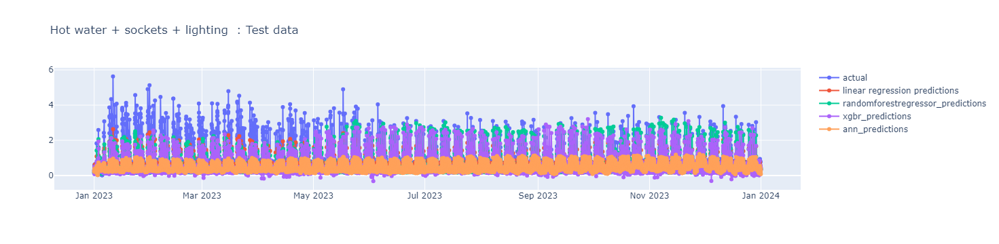

In [214]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["y"].to_numpy(),
                    mode='lines+markers',
                    name='actual'))
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["predictions"].to_numpy(),
                    mode='lines+markers',
                    name='linear regression predictions'))
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["rf_predictions"].to_numpy(),
                    mode='lines+markers',
                    name='randomforestregressor_predictions'))
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["xgb_predictions"].to_numpy(),
                    mode='lines+markers',
                    name='xgbr_predictions'))
fig.add_trace(go.Scatter(x=plot_data["time"].to_numpy(), y=plot_data["ann_predictions"].to_numpy(),
                    mode='lines+markers',
                    name='ann_predictions'))
fig.update_layout(title_text="Hot water + sockets + lighting  : Test data")
fig.show()

In [215]:
file_name = 'all_other2.html'
plotly.offline.plot(fig, filename=asset_path + file_name)

'.././assets/all_other2.html'

### Composite model

In [216]:
model_predictions.head()

,time,cs_predictions,sh_predictions,cc_predictions
0,2023-01-01 00:00:00+00,0.509871,3.417115,-0.259127
1,2023-01-01 01:00:00+00,0.506084,3.045089,-0.128797
2,2023-01-01 02:00:00+00,0.506539,1.990622,0.041422
3,2023-01-01 03:00:00+00,0.506878,1.934897,0.196618
4,2023-01-01 04:00:00+00,0.507721,1.811163,0.327001


In [217]:
plot_data = plot_data.rename(columns={"predictions": "linear_predictions"})
plot_data.head()

,time,linear_predictions,y,rf_predictions,xgb_predictions,ann_predictions
0,2023-01-01 00:00:00+00,0.272502,0.142263,0.202317,0.275144,0.238060
1,2023-01-01 01:00:00+00,0.173801,0.137709,0.339062,0.282529,0.222900
2,2023-01-01 02:00:00+00,0.224970,0.160749,0.309596,0.395922,0.240008
3,2023-01-01 03:00:00+00,0.282125,0.600717,0.290462,0.281834,0.306060
4,2023-01-01 04:00:00+00,0.490521,0.262675,0.147239,0.072923,0.366529


In [218]:
plot_data = plot_data.drop(columns=["y"], axis=1)
plot_data.head()

,time,linear_predictions,rf_predictions,xgb_predictions,ann_predictions
0,2023-01-01 00:00:00+00,0.272502,0.202317,0.275144,0.238060
1,2023-01-01 01:00:00+00,0.173801,0.339062,0.282529,0.222900
2,2023-01-01 02:00:00+00,0.224970,0.309596,0.395922,0.240008
3,2023-01-01 03:00:00+00,0.282125,0.290462,0.281834,0.306060
4,2023-01-01 04:00:00+00,0.490521,0.147239,0.072923,0.366529


In [219]:
tmp_data = data[["car_chargers", "bld_engcons"]].reset_index(drop=0)
comp_data = plot_data[["time", "rf_predictions"]].merge(tmp_data, on="time", how="inner").reset_index(drop=1)
comp_data.shape, plot_data.shape

((8742, 4), (8742, 5))

In [220]:
comp_data.head()

,time,rf_predictions,car_chargers,bld_engcons
0,2023-01-01 00:00:00+00,0.202317,0.0,4.654871
1,2023-01-01 01:00:00+00,0.339062,0.0,3.786356
2,2023-01-01 02:00:00+00,0.309596,0.0,2.418283
3,2023-01-01 03:00:00+00,0.290462,0.0,2.369816
4,2023-01-01 04:00:00+00,0.147239,0.0,2.684563


In [221]:
model_predictions.head()

,time,cs_predictions,sh_predictions,cc_predictions
0,2023-01-01 00:00:00+00,0.509871,3.417115,-0.259127
1,2023-01-01 01:00:00+00,0.506084,3.045089,-0.128797
2,2023-01-01 02:00:00+00,0.506539,1.990622,0.041422
3,2023-01-01 03:00:00+00,0.506878,1.934897,0.196618
4,2023-01-01 04:00:00+00,0.507721,1.811163,0.327001


In [222]:
comp_data = comp_data.merge(model_predictions, on="time", how="inner")
comp_data.shape

(8742, 7)

In [223]:
comp_data.head()

,time,rf_predictions,car_chargers,bld_engcons,cs_predictions,sh_predictions,cc_predictions
0,2023-01-01 00:00:00+00,0.202317,0.0,4.654871,0.509871,3.417115,-0.259127
1,2023-01-01 01:00:00+00,0.339062,0.0,3.786356,0.506084,3.045089,-0.128797
2,2023-01-01 02:00:00+00,0.309596,0.0,2.418283,0.506539,1.990622,0.041422
3,2023-01-01 03:00:00+00,0.290462,0.0,2.369816,0.506878,1.934897,0.196618
4,2023-01-01 04:00:00+00,0.147239,0.0,2.684563,0.507721,1.811163,0.327001


In [224]:
cols = ["rf_predictions", "cs_predictions", "sh_predictions"]
comp_data["bld_engcons_predicted"] = comp_data[cols].sum(axis=1)
comp_data.head()

,time,rf_predictions,car_chargers,bld_engcons,cs_predictions,sh_predictions,cc_predictions,bld_engcons_predicted
0,2023-01-01 00:00:00+00,0.202317,0.0,4.654871,0.509871,3.417115,-0.259127,4.129304
1,2023-01-01 01:00:00+00,0.339062,0.0,3.786356,0.506084,3.045089,-0.128797,3.890236
2,2023-01-01 02:00:00+00,0.309596,0.0,2.418283,0.506539,1.990622,0.041422,2.806757
3,2023-01-01 03:00:00+00,0.290462,0.0,2.369816,0.506878,1.934897,0.196618,2.732237
4,2023-01-01 04:00:00+00,0.147239,0.0,2.684563,0.507721,1.811163,0.327001,2.466123


In [225]:
cal_metrics(comp_data["bld_engcons"], comp_data["bld_engcons_predicted"])

MAE:
0.3855146738550432
MAPE:
45897263886248.68
R2 score: 
0.7951295800541212


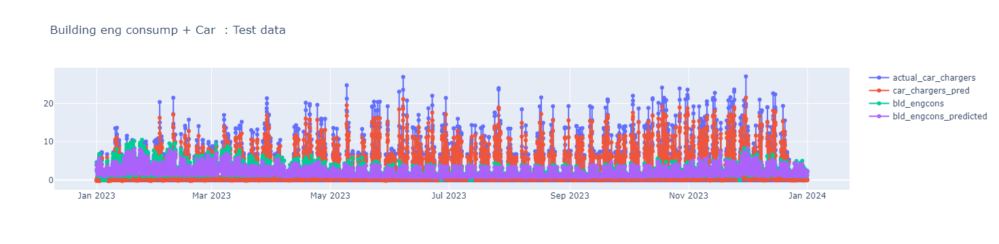

In [226]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=comp_data["time"].to_numpy(), y=comp_data["car_chargers"].to_numpy(),
                    mode='lines+markers',
                    name='actual_car_chargers'))
fig.add_trace(go.Scatter(x=comp_data["time"].to_numpy(), y=comp_data["cc_predictions"].to_numpy(),
                    mode='lines+markers',
                    name='car_chargers_pred'))
fig.add_trace(go.Scatter(x=comp_data["time"].to_numpy(), y=comp_data["bld_engcons"].to_numpy(),
                    mode='lines+markers',
                    name='bld_engcons'))
fig.add_trace(go.Scatter(x=comp_data["time"].to_numpy(), y=comp_data["bld_engcons_predicted"].to_numpy(),
                    mode='lines+markers',
                    name='bld_engcons_predicted'))
fig.update_layout(title_text="Building eng consump + Car  : Test data")
fig.show()

In [227]:
file_name = 'bldg_eng_consump2.html'
plotly.offline.plot(fig, filename=asset_path + file_name)

'.././assets/bldg_eng_consump2.html'